<h1>Содержание<span class="tocSkip"></span></h1>
<br>
<div class="toc">
    <ul class="toc-item">
        <li>
            <span>
                <a href="#1-Подготовка-окружения">
                    <span class="toc-item-num">1&nbsp;&nbsp;</span>
                    Подготовка окружения
                </a>
            </span>
        </li>
        <li>
            <span>
                <a href="#2-Загрузка-данных">
                    <span class="toc-item-num">2&nbsp;&nbsp;</span>
                    Загрузка данных
                </a>
            </span>
        </li>
        <li>
            <span>
                <a href="#3-Базовая-модель 64x64">
                    <span class="toc-item-num">3.&nbsp;&nbsp;</span>
                    Базовая модель 64x64
                </a>
            </span>
            <ul class="toc-item">
                <li>
                    <span>
                        <a href="#3.1-Генератор">
                            <span class="toc-item-num">3.1&nbsp;&nbsp;</span>
                            Генератор
                        </a>
                    </span>
                </li>
                <li>
                    <span>
                        <a href="#3.2-Дискриминатор">
                            <span class="toc-item-num">3.2&nbsp;&nbsp;</span>
                            Дискриминатор
                        </a>
                    </span>
                </li>
                <li>
                    <span>
                        <a href="#3.3-Обучение-модели">
                            <span class="toc-item-num">3.3&nbsp;&nbsp;</span>
                            Обучение модели
                        </a>
                    </span>
                </li>
            </ul>
        </li>
        <li>
            <span>
                <a href="#4-Общий-вывод">
                    <span class="toc-item-num">4&nbsp;&nbsp;</span>
                    Общий вывод
                </a>
            </span>
        </li>
    </ul>
</div>

# Генеративно-состязательная сеть | GAN 64x64

**Постановка задачи:** натренировать генеративную модель - автоэнкодер или генеративно-состязательную сеть для генерации изображений животных.

**Источник данных:** датасет [petfaces.tar.gz](http://www.soshnikov.com/permanent/data/petfaces.tar.gz) или [Oxford-IIIT](https://www.robots.ox.ac.uk/~vgg/data/pets/).

**Характер данных:** 

* *petfaces:* 35 пород домашних животных (12 пород кошек и 23 породы собак), по 200 изображений на каждый класс (изображение центрированы и уменьшены до небольшого размера) 
* *Oxford-IIIT:* 37 категорий животных по 200 изображений на каждый класс

**Основные этапы:** 

1. Начать экспериментировать с изображениями небольшого размера - 64x64 пикселя.
2. Затем посмотреть, получится ли увеличить размер до 128x128 или 256x256.

<div style="background-color: blue; height: 2px; margin: 10px 0;"></div>

# Реализации:

1. Базовая линейная модель (текущий файл)
2. [DCGAN 64x64](https://github.com/MAILabs-Edu-2023/magai_lab2_cnn-lab_ai/blob/main/DCGAN_64x64.ipynb)
3. [DCGAN 128x128](https://github.com/MAILabs-Edu-2023/magai_lab2_cnn-lab_ai/blob/main/DCGAN_128x128.ipynb)

**Обоснование разделения файлов:** в ходе множественных испытаний было замечено, что при последовательном обучении нескольких по-разному реализованных генеративно-состязательных сетей результаты каким-то образом воздействовали друг на друга, из-за чего генерация изображений происходила некорректно.

<div style="background-color: blue; height: 2px; margin: 10px 0;"></div>

## 1 Подготовка окружения

Установка необходимых библиотек:

In [1]:
%%capture --no-display
import torch
if torch.__version__ != '1.13.1+cu117':
    !pip3 install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu117

In [2]:
%%capture --no-display
!pip install wget torchinfo

Импорт библиотек:

In [3]:
import numpy as np

from tqdm.notebook import tqdm
from functools import reduce
from typing import Tuple

import random
import os
import kaggle
import zipfile as zf

import torch
import torch.nn as nn
import torch.optim as optim

from torch.nn import functional as F
from torch.utils.data import DataLoader, Dataset

from torchinfo import summary

from torchvision import datasets, transforms
from torchvision.utils import make_grid

from utils.plot_charts import plot_random_image, plot_transformed_images, \
                              plot_loss, save_image, create_gif, plot_comparison_real_fake

Задание случайных величин:

In [4]:
SEED = 777

random.seed(SEED)
torch.manual_seed(SEED)

Выведение на экран текущего устройства:

In [5]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

print('Current device:', device)

Current device: cuda


<div style="background-color: blue; height: 2px; margin: 10px 0;"></div>

## 2 Загрузка данных

Добавление папки `data`:

In [6]:
if os.path.isdir('data/') == False:
    os.mkdir('data/')

Задание пути до папки с набором данных:

In [7]:
path_data = 'data/oxford_pets'

Скачивание набора данных:

In [8]:
if os.path.isdir(path_data) == False:
    os.chdir('data/')
    
    !kaggle datasets download -d tanlikesmath/the-oxfordiiit-pet-dataset
    
    with zf.ZipFile('data/the-oxfordiiit-pet-dataset.zip', 'r') as file:
        file.extractall('.')
    
    os.rename('images', 'oxford_pets')
    os.remove('the-oxfordiiit-pet-dataset.zip')
    
    os.chdir('..')

Выведение на экран изображения и его параметров:

Путь к изображению: data\oxford_pets\images\Birman_38.jpg
Класс изображения: images
Высота: 375 | Ширина: 500
Размерность изображения (375, 500, 3) -> [height, width, color_channels]


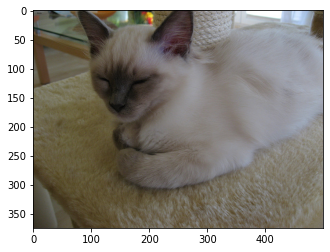

In [9]:
plot_random_image(path_data, depth='*/*')

<div style="background-color: blue; height: 2px; margin: 10px 0;"></div>

## 3 Базовая модель 64x64

Задание констант:

In [10]:
SIZE = 64
BATCH_SIZE = 16
N_WORKERS = os.cpu_count()
SAMPLE_SIZE = 100

Задание трансформатора изображений:

In [11]:
data_transforms = transforms.Compose([
    transforms.Resize((SIZE, SIZE)), 
    transforms.ToTensor(),
])

Выведение на экран исходного и трансформированного изображений:

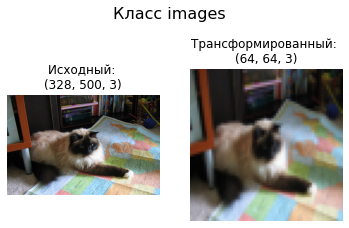

In [12]:
plot_transformed_images(data_transforms, 1, path_data, depth='*/*')

Формирование тренировочного датасета:

In [13]:
train_data = datasets.ImageFolder(
    root=path_data, 
    transform=data_transforms
)

Выведение на экран описания тренировочного датасета:

In [14]:
train_data

Dataset ImageFolder
    Number of datapoints: 7389
    Root location: data/oxford_pets
    StandardTransform
Transform: Compose(
               Resize(size=(64, 64), interpolation=bilinear, max_size=None, antialias=None)
               ToTensor()
           )

Преобразование датасета в загрузчик данных:

In [15]:
train_dataloader = DataLoader(
    dataset=train_data, 
    batch_size=BATCH_SIZE, 
    num_workers=N_WORKERS,
    shuffle=True,
    drop_last=True
)

---

### 3.1 Генератор

Задание класса генератора:

In [16]:
class Generator(nn.Sequential):
    def __init__(self, sample_size: int, batch_size: int, img_shape: torch.Tensor) -> None:
        
        self.sample_size = sample_size
        self.img_shape = img_shape
        self.batch_size = batch_size
        
        img_size = img_shape[-1]
        img_dim = reduce(lambda x, y: x*y, self.img_shape)
        
        super().__init__(
            nn.Linear(sample_size, img_size * 2),
            nn.LeakyReLU(0.01),
            nn.Linear(img_size * 2, img_dim),
            nn.Sigmoid()
        )

    def forward(self) -> torch.Tensor:
        z = torch.randn(self.batch_size, self.sample_size).to(device)
        x = super().forward(z)
        x = x.reshape(self.batch_size, *self.img_shape)
        
        return x

Объявление класса генератора:

In [17]:
generator = Generator(SAMPLE_SIZE, BATCH_SIZE, train_data[0][0].shape).to(device)

Выведение на экран слоёв генератора:

In [18]:
generator

Generator(
  (0): Linear(in_features=100, out_features=128, bias=True)
  (1): LeakyReLU(negative_slope=0.01)
  (2): Linear(in_features=128, out_features=12288, bias=True)
  (3): Sigmoid()
)

Выведение на экран подробного описания процесса изменения тензоров по ходу работы модели и информации о модели:

In [19]:
summary(generator)

Layer (type:depth-idx)                   Param #
Generator                                --
├─Linear: 1-1                            12,928
├─LeakyReLU: 1-2                         --
├─Linear: 1-3                            1,585,152
├─Sigmoid: 1-4                           --
Total params: 1,598,080
Trainable params: 1,598,080
Non-trainable params: 0

---

### 3.2 Дискриминатор

Задание класса дискриминатора:

In [20]:
class Discriminator(nn.Sequential):
    def __init__(self, img_shape: torch.Tensor) -> None:
        
        img_size = img_shape[-1]
        self.img_dim = reduce(lambda x, y: x*y, img_shape)
        
        super().__init__(
            nn.Linear(self.img_dim, img_size * 2),
            nn.LeakyReLU(0.01),
            nn.Linear(img_size * 2, 1)
        )

    def forward(self, z: torch.Tensor) -> torch.Tensor:
        x = super().forward(z.reshape(-1, self.img_dim))
        return x

Объявление класса дискриминатора:

In [21]:
discriminator = Discriminator(train_data[0][0].shape).to(device)

Выведение на экран слоёв дискриминатора:

In [22]:
discriminator

Discriminator(
  (0): Linear(in_features=12288, out_features=128, bias=True)
  (1): LeakyReLU(negative_slope=0.01)
  (2): Linear(in_features=128, out_features=1, bias=True)
)

Выведение на экран подробного описания процесса изменения тензоров по ходу работы модели и информации о модели:

In [23]:
summary(discriminator)

Layer (type:depth-idx)                   Param #
Discriminator                            --
├─Linear: 1-1                            1,572,992
├─LeakyReLU: 1-2                         --
├─Linear: 1-3                            129
Total params: 1,573,121
Trainable params: 1,573,121
Non-trainable params: 0

---

### 3.3 Обучение модели

Задание класса обучения:

In [24]:
class GAN:
    
    def __init__(self, generator, discriminator, device: str = device) -> None:        
        self.generator = generator
        self.discriminator = discriminator
        self.device = device
        
        self.real_targets = torch.ones(16, 1).to(self.device)
        self.fake_targets = torch.zeros(16, 1).to(self.device)
        
        
    def train(self, 
              n_epochs: int, 
              dataloader: torch.utils.data.dataloader.DataLoader,
              criterion: torch.nn.functional,
              optim_dis: torch.optim,
              optim_gen: torch.optim,
              img_title: str) -> None:
        
        self.img_title = img_title
        self.__criterion = criterion
        self.__optim_dis = optim_dis
        self.__optim_gen = optim_gen
        
        self.images = []
        self.loss_discriminator = []
        self.loss_generator = []
        
        
        for epoch in tqdm(range(n_epochs), 'Training process'):
            for i, data in enumerate(dataloader):
                
                pred_dis, pred_gen_before, loss_dis = self.train_discriminator(data)
                pred_gen_after, loss_gen = self.train_generator()
                
                self.loss_discriminator.append(loss_dis)
                self.loss_generator.append(loss_gen)
                
                if i == 0 or i % 200 == 0 or i == len(dataloader) - 1:                    
                    self.print_iter(epoch, n_epochs, i, len(dataloader) - 1,
                                    loss_dis, loss_gen, pred_dis, pred_gen_before, pred_gen_after)
            
                with torch.no_grad():
                    fake_img = self.generator().cpu()
                self.images.append(make_grid(fake_img, 4, padding=2, normalize=True))
            
            save_image(epoch, self.img_title, self.images[-1], n_col=4)
            
            
    def print_iter(self, *args):
        print('[%d/%d][%d/%d]\tLoss Dis: %.4f\tLoss Gen: %.4f\tPred Dis: %.4f\tPred Gen: %.4f / %.4f'
              % (args))
            
            
    def train_discriminator(self, data: list) -> Tuple[float, float, float]:
        self.discriminator.train()
        
        real_images = data[0].to(self.device)
        
        # forward real
        pred_real = self.discriminator(real_images)
        loss_real = self.__criterion(pred_real, self.real_targets)
        
        pred_dis = pred_real.mean().item()

        self.generator.eval()
        with torch.no_grad():
            generated_images = self.generator().to(self.device)

        # forward fake
        pred_fake = self.discriminator(generated_images)
        loss_fake = self.__criterion(pred_fake, self.fake_targets)
        
        pred_gen_before = pred_fake.mean().item()
        
        loss = loss_real + loss_fake

        # backward
        self.__optim_dis.zero_grad()
        loss.backward()
        self.__optim_dis.step()

        return pred_dis, pred_gen_before, loss.item()
    
    
    def train_generator(self) -> Tuple[float, float]:
        self.generator.train()
        
        generated_images = self.generator().to(self.device)

        # forward
        self.discriminator.eval()
        pred = self.discriminator(generated_images)
        loss = self.__criterion(pred, self.real_targets)
        
        pred_gen_after = pred.mean().item()

        # backward
        self.__optim_gen.zero_grad()
        loss.backward()
        self.__optim_gen.step()
        
        return pred_gen_after, loss.item()
       
    
    def print_generation_gif(self, path: str = 'visualization/') -> None:
        create_gif(self.img_title)
        
        from IPython.display import Image

        with open(f'{path}gifs/{self.img_title}.gif', 'rb') as file:
            display(Image(file.read()))

---

Задание констант:

In [25]:
N_EPOCHS = 50
CRITERION = nn.BCELoss()

OPTIM_GEN = torch.optim.Adam(generator.parameters(), lr=1e-4)
OPTIM_DIS = torch.optim.Adam(discriminator.parameters(), lr=1e-3)

Объявление экземпляра класса:

In [26]:
gan_64 = GAN(generator, discriminator)

Обучение модели:

In [27]:
gan_64.train(
    n_epochs=N_EPOCHS,
    dataloader=train_dataloader,
    criterion=F.binary_cross_entropy_with_logits,
    optim_gen=OPTIM_GEN,
    optim_dis=OPTIM_DIS,
    img_title='gan_64'
)

Training process:   0%|          | 0/50 [00:00<?, ?it/s]

[0/50][0/460]	Loss Dis: 1.4109	Loss Gen: 8.4176	Pred Dis: 0.1513	Pred Gen: 0.1841 / -8.4174
[0/50][200/460]	Loss Dis: 1.4468	Loss Gen: 1.4335	Pred Dis: -0.4442	Pred Gen: -0.5845 / -1.1605
[0/50][400/460]	Loss Dis: 0.4079	Loss Gen: 1.5758	Pred Dis: 1.9954	Pred Gen: -1.5884 / -1.2969
[0/50][460/460]	Loss Dis: 0.4348	Loss Gen: 1.7724	Pred Dis: 2.1964	Pred Gen: -1.2917 / -1.5840
[1/50][0/460]	Loss Dis: 0.4876	Loss Gen: 2.1591	Pred Dis: 2.3846	Pred Gen: -1.2783 / -2.0323
[1/50][200/460]	Loss Dis: 0.5451	Loss Gen: 2.1867	Pred Dis: 4.6049	Pred Gen: -2.3261 / -2.0652
[1/50][400/460]	Loss Dis: 0.3482	Loss Gen: 2.0250	Pred Dis: 6.2164	Pred Gen: -1.4868 / -1.8793
[1/50][460/460]	Loss Dis: 0.2979	Loss Gen: 3.9061	Pred Dis: 7.2027	Pred Gen: -3.0841 / -3.8845
[2/50][0/460]	Loss Dis: 0.8501	Loss Gen: 2.6873	Pred Dis: 4.5741	Pred Gen: -3.5092 / -2.6149
[2/50][200/460]	Loss Dis: 0.4300	Loss Gen: 2.5908	Pred Dis: 8.8543	Pred Gen: -1.6167 / -2.5081
[2/50][400/460]	Loss Dis: 0.6871	Loss Gen: 2.9778	Pred D

[21/50][400/460]	Loss Dis: 0.6073	Loss Gen: 1.9576	Pred Dis: 7.6406	Pred Gen: -1.4787 / -1.6926
[21/50][460/460]	Loss Dis: 0.6817	Loss Gen: 1.3298	Pred Dis: 4.5866	Pred Gen: -2.0943 / -0.9223
[22/50][0/460]	Loss Dis: 0.8369	Loss Gen: 2.1555	Pred Dis: 7.6372	Pred Gen: -0.4087 / -1.9036
[22/50][200/460]	Loss Dis: 0.4742	Loss Gen: 2.0744	Pred Dis: 4.0792	Pred Gen: -1.1104 / -1.8503
[22/50][400/460]	Loss Dis: 0.3218	Loss Gen: 2.7713	Pred Dis: 8.1758	Pred Gen: -2.8252 / -2.6860
[22/50][460/460]	Loss Dis: 0.3554	Loss Gen: 3.8749	Pred Dis: 5.9627	Pred Gen: -3.7949 / -3.8408
[23/50][0/460]	Loss Dis: 0.8804	Loss Gen: 2.6774	Pred Dis: 5.1307	Pred Gen: -3.3822 / -2.5808
[23/50][200/460]	Loss Dis: 0.4647	Loss Gen: 1.9757	Pred Dis: 7.7885	Pred Gen: -1.3911 / -1.8083
[23/50][400/460]	Loss Dis: 0.5009	Loss Gen: 1.6062	Pred Dis: 5.5025	Pred Gen: -2.1527 / -1.2001
[23/50][460/460]	Loss Dis: 0.8510	Loss Gen: 2.4082	Pred Dis: 4.8272	Pred Gen: -1.5318 / -2.2306
[24/50][0/460]	Loss Dis: 0.4237	Loss Gen: 2.

[43/50][0/460]	Loss Dis: 0.6318	Loss Gen: 1.6912	Pred Dis: 3.6840	Pred Gen: -1.7263 / -1.3874
[43/50][200/460]	Loss Dis: 0.7904	Loss Gen: 1.4362	Pred Dis: 3.2721	Pred Gen: -1.9517 / -1.0101
[43/50][400/460]	Loss Dis: 0.4642	Loss Gen: 2.2656	Pred Dis: 5.1357	Pred Gen: -0.9417 / -2.1315
[43/50][460/460]	Loss Dis: 0.3675	Loss Gen: 1.9981	Pred Dis: 3.7371	Pred Gen: -2.0031 / -1.7095
[44/50][0/460]	Loss Dis: 0.6157	Loss Gen: 1.9427	Pred Dis: 2.9307	Pred Gen: -0.9858 / -1.7128
[44/50][200/460]	Loss Dis: 0.8716	Loss Gen: 2.3428	Pred Dis: 2.9802	Pred Gen: -2.2080 / -2.2131
[44/50][400/460]	Loss Dis: 0.5826	Loss Gen: 1.8439	Pred Dis: 4.6465	Pred Gen: -1.9078 / -1.5384
[44/50][460/460]	Loss Dis: 1.1353	Loss Gen: 1.7541	Pred Dis: 3.4138	Pred Gen: -1.2801 / -1.3212
[45/50][0/460]	Loss Dis: 1.9551	Loss Gen: 1.1226	Pred Dis: 0.5726	Pred Gen: -0.6486 / -0.5432
[45/50][200/460]	Loss Dis: 0.8738	Loss Gen: 1.2312	Pred Dis: 3.5949	Pred Gen: -1.3023 / -0.6505
[45/50][400/460]	Loss Dis: 0.8187	Loss Gen: 1.

Выведение на экран графика значений функции потерь:

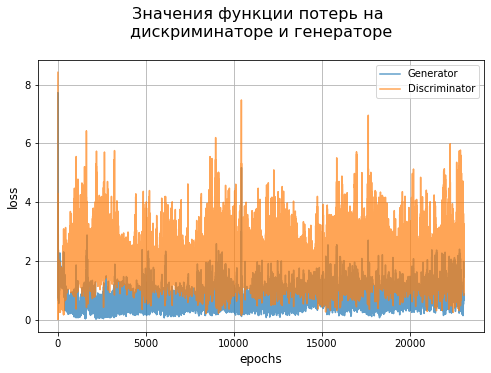

In [28]:
plot_loss(gan_64.loss_generator, gan_64.loss_discriminator)

Выведение на экран результата обучения:

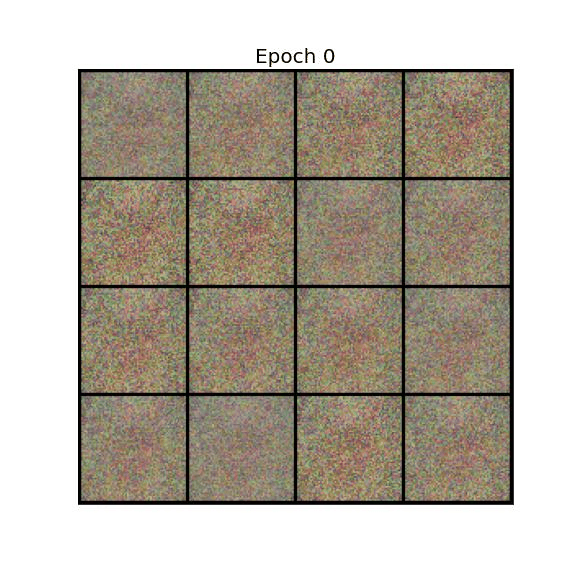

In [29]:
gan_64.print_generation_gif()

Выведение сравнения настоящих и сгенерированных фотографий:

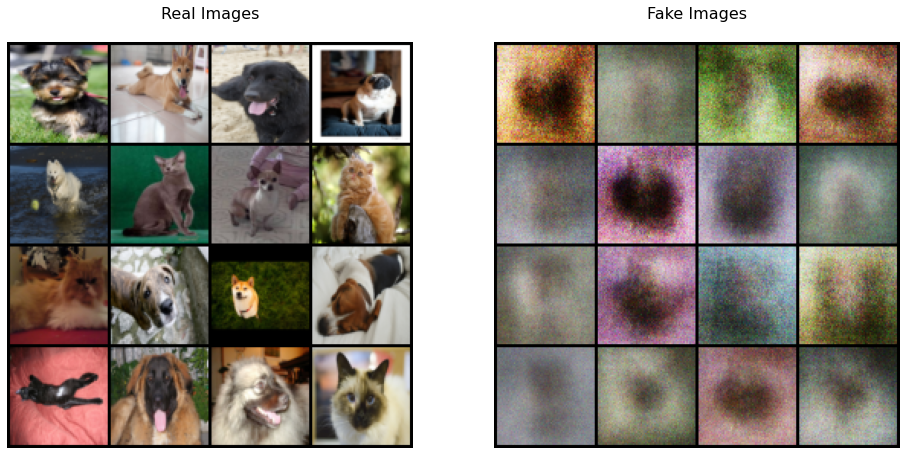

In [30]:
plot_comparison_real_fake(train_dataloader, gan_64.images, device)

>В силу простоты архитектуры базовая модель не справилась с поставленной задачей.

<div style="background-color: blue; height: 2px; margin: 10px 0;"></div>

## 4 Общий вывод

На основании датасета с домашними животными был проведён эксперимент по построению простой архитектуры генеративно-состязательной сети (обучение проведено на датасете с размером изображений 64х64), которая продемонстрировала плохую предсказательную способность в рамках поставленной задачи.

<div style="text-align: center; font-size: 20px; padding: 15px 0;">
    <a href="#Содержание" data-toc-modified-id="Содержание" style="text-decoration: none; color: #296eaa; border: 2px dashed #296eaa; opacity: 0.8; border-radius: 3px; padding: 10px 80px;">
        В начало файла ↑
    </a>
</div>